# Introduction

[Deployed App Link](https://huggingface.co/spaces/galuhalifani/recycling_classification)

================================================

This report is made as part of ANN machine learning model creation on recyclable garbage classification, in order to help individuals and businesses better sort garbage to help reduce environmental harms.

Sections in this report:
1. Introduction
2. Data Loading
3. Data Analysis
4. Feature Engineering
5. Model Training & Evaluation
6. Model Improvement & Evaluation
7. Model Saving
8. Model Inference

=================================================

## Problem Identification

In Indonesia, waste is often thrown away without being sorted — all recyclables are combined together, and plastic, food scraps, paper, and even hazardous items all end up in the same bin. This lack of proper waste separation, especially at the household and small business level, makes it nearly impossible to recycle effectively. As a result, recyclable materials end up in the ocean instead of being recycled, organic waste ends up in landfills, and hazardous materials were not properly handled, posing dangers to the environment. This accelerates pollution in cities, rivers, and oceans.

## Objective

This project will build an image classifier using an Artificial Neural Network (ANN) with CNN layers, to recognize the type of recyclable materials (e.g., plastic, glass, metal) from photos. The goal is to assist users and machines in identifying the correct category to dispose recyclables.

This model can be used by individuals, businesses, or as base model for garbage sorting machines to sort recyclable garbages.

## Data Information

*Data Source: [Garbage Classification, Kaggle](https://www.kaggle.com/datasets/asdasdasasdas/garbage-classification)*

**Dataset Description**

> The Garbage Classification Dataset contains 2.5k images from 6 garbage categories: cardboard (393), glass (491), metal (400), paper(584), plastic (472) and trash(127). The pictures were taken by placing the object on a white posterboard and using sunlight and/or room lighting.

The original dataset were obtained by Yang, Mindy and Thung, Gary for their [Stanford paper](https://cs229.stanford.edu/proj2016/report/ThungYang-ClassificationOfTrashForRecyclabilityStatus-report.pdf)

# Import Library

In [5]:
# Import libraries

import os
import shutil
import json
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from pathlib import Path
from PIL import Image
import kagglehub
import seaborn as sns
from pprint import pprint
import cv2
import hashlib
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import EfficientNetB0, MobileNetV2, NASNetMobile
from tensorflow.keras import layers, models, Input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import regularizers
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing import image

try:
  import imagehash
except:
  !pip install imagehash
finally:
  import imagehash

try:
  from jmd_imagescraper.core import *
except:
  !pip install -q jmd_imagescraper
finally:
  from jmd_imagescraper.core import *

try:
  from bing_image_downloader import downloader
except:
  !pip install -q bing-image-downloader
finally:
  from bing_image_downloader import downloader

# Check TensorFlow version
print(tf.__version__)

2.19.0


# Data Loading

In [ ]:
# clear cache if needed
def clearFolderCache(folderPath):
  cache_path = os.path.expanduser(folderPath)
  if os.path.exists(cache_path):
      shutil.rmtree(cache_path)
      print("Cache cleared.")
  else:
      print("No cache found.")

# remove folder if needed
def removeFolder(path):
  if os.path.exists(path):
      shutil.rmtree(path)
      print(f"Folder {path} removed.")
  else:
      print(f"Folder {path} not found.")

# rename folder if needed
def renameFolder(old_path, new_path):
  os.rename(old_path, new_path)
  print(f"Folder {old_path} renamed to {new_path}.")

def copy_entire_tree(src_dir, dst_dir):
    if not os.path.exists(dst_dir):
        os.makedirs(dst_dir)

    for root, dirs, files in os.walk(src_dir):
        rel_path = os.path.relpath(root, src_dir)
        dest_root = os.path.join(dst_dir, rel_path)

        os.makedirs(dest_root, exist_ok=True)

        for file in files:
            src_file = os.path.join(root, file)
            dst_file = os.path.join(dest_root, file.lower())

            if os.path.exists(dst_file):
                print(f"Skipping existing file: {dst_file}")
                continue

            shutil.copy(src_file, dst_file)

parent_folder = '/content/dataset'

# Download latest version
removeFolder(parent_folder)
clearFolderCache('~/.cache/kagglehub/datasets')
path = kagglehub.dataset_download("asdasdasasdas/garbage-classification")

print("Path to dataset files:", path)

os.makedirs(parent_folder, exist_ok=True)
copy_entire_tree(path, parent_folder)
print("Copied dataset files to:", parent_folder)

Folder /content/dataset not found.
No cache found.
Path to dataset files: /kaggle/input/garbage-classification
Copied dataset files to: /content/dataset


In [3]:
# remove unncecessary sub-folder
image_path = os.path.join(parent_folder, 'garbage classification')
image_subFolder = os.path.join(image_path, 'Garbage classification')
for folder in os.listdir(image_subFolder):
  full_image_path = os.path.join(image_subFolder, folder)
  shutil.move(full_image_path, image_path)
print("Moved image files to:", image_path)
removeFolder(image_subFolder)

Moved image files to: /content/dataset/garbage classification
Folder /content/dataset/garbage classification/Garbage classification removed.


In [4]:
# rename folder for easier processing
new_folder_name = os.path.join(parent_folder, 'garbage_classification')
renameFolder(image_path, new_folder_name)
image_path = new_folder_name

Folder /content/dataset/garbage classification renamed to /content/dataset/garbage_classification.


In [5]:
#check folder structure

for root, dirs, files in os.walk(image_path):
    print("Folder:", root)
    print("  Subfolders:", dirs)
    print("  Files:", files[:5])  # just print a few
    print("------")

Folder: /content/dataset/garbage_classification
  Subfolders: ['trash', 'paper', 'cardboard', 'plastic', 'metal', 'glass']
  Files: []
------
Folder: /content/dataset/garbage_classification/trash
  Subfolders: []
  Files: ['trash34.jpg', 'trash100.jpg', 'trash32.jpg', 'trash59.jpg', 'trash75.jpg']
------
Folder: /content/dataset/garbage_classification/paper
  Subfolders: []
  Files: ['paper523.jpg', 'paper8.jpg', 'paper314.jpg', 'paper444.jpg', 'paper470.jpg']
------
Folder: /content/dataset/garbage_classification/cardboard
  Subfolders: []
  Files: ['cardboard162.jpg', 'cardboard334.jpg', 'cardboard129.jpg', 'cardboard271.jpg', 'cardboard331.jpg']
------
Folder: /content/dataset/garbage_classification/plastic
  Subfolders: []
  Files: ['plastic472.jpg', 'plastic16.jpg', 'plastic296.jpg', 'plastic436.jpg', 'plastic238.jpg']
------
Folder: /content/dataset/garbage_classification/metal
  Subfolders: []
  Files: ['metal300.jpg', 'metal82.jpg', 'metal187.jpg', 'metal80.jpg', 'metal381.jpg'

In [6]:
# generating dataframe
cardboard_files = glob(f'{image_path}/cardboard/*')
paper_files = glob(f'{image_path}/paper/*')
plastic_files = glob(f'{image_path}/plastic/*')
metal_files = glob(f'{image_path}/metal/*')
glass_files = glob(f'{image_path}/glass/*')
trash_files = glob(f'{image_path}/trash/*')

# Combine files
all_files = (
    cardboard_files +
    paper_files +
    plastic_files +
    metal_files +
    glass_files +
    trash_files
)

cardboard = ['cardboard' for i in range(len(cardboard_files))]
paper = ['paper' for i in range(len(paper_files))]
plastic = ['plastic' for i in range(len(plastic_files))]
metal = ['metal' for i in range(len(metal_files))]
glass = ['glass' for i in range(len(glass_files))]
trash = ['trash' for i in range(len(trash_files))]


# Corresponding original categories
category = cardboard + paper + plastic + metal + glass + trash

img_df = pd.DataFrame({'images': all_files, 'category': category})
img_df

,images,category
0,/content/dataset/garbage_classification/cardbo...,cardboard
1,/content/dataset/garbage_classification/cardbo...,cardboard
2,/content/dataset/garbage_classification/cardbo...,cardboard
3,/content/dataset/garbage_classification/cardbo...,cardboard
4,/content/dataset/garbage_classification/cardbo...,cardboard
...,...,...
2522,/content/dataset/garbage_classification/trash/...,trash
2523,/content/dataset/garbage_classification/trash/...,trash
2524,/content/dataset/garbage_classification/trash/...,trash
2525,/content/dataset/garbage_classification/trash/...,trash


We have 2.5k total image samples from 6 classes

# Exploratory Data Analysis (EDA)

## Store reusable EDA functions

In [ ]:
# reusable functions for EDA
def hash_image(path):
    with Image.open(path) as img:
      return str(imagehash.phash(img))

def show_samples(df, label=None, n=30):
    '''
    Function to show sample images from dataframe
    '''
    sample_df = df[df['category'] == label] if label is not None else df
    sample_paths = sample_df.sample(n)['images'].tolist()

    cols = 5
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()

    for i, path in enumerate(sample_paths):
        img = Image.open(path)
        axes[i].imshow(img)

    plt.tight_layout()
    plt.show()

def get_image_info(path):
    with Image.open(path) as img:
        width, height = img.size
    return pd.Series([width, height, width / height])

def getStats(df):
  width_stats = {
    'mean': df['width'].mean(),
    'std': df['width'].std(),
    'min': df['width'].min(),
    'max': df['width'].max(),
    'range': df['width'].max() - df['width'].min(),
    'variance': df['width'].var()
  }

  height_stats = {
    'mean': df['height'].mean(),
    'std': df['height'].std(),
    'min': df['height'].min(),
    'max': df['height'].max(),
    'range': df['height'].max() - df['height'].min(),
    'variance': df['height'].var()
  }

  aspect_ratio = {
    'mean': df['aspect_ratio'].mean(),
    'std': round(df['aspect_ratio'].std(), 3),
    'min': df['aspect_ratio'].min(),
    'max': df['aspect_ratio'].max(),
    'range': df['aspect_ratio'].max() - df['aspect_ratio'].min(),
    'variance': round(df['aspect_ratio'].var(), 3)
  }

  return width_stats, height_stats, aspect_ratio

def print_size_stats(df):
    df[['width', 'height', 'aspect_ratio']] = df['images'].apply(get_image_info)
    width_stats, height_stats, aspect_ratio = getStats(df)

    print("Width Statistics:")
    pprint(width_stats)

    print("\nHeight Statistics:")
    pprint(height_stats)

    print("\nAspect Ratio:")
    pprint(aspect_ratio)

def get_brightness(path):
    with Image.open(path).convert('L') as img:
        return np.array(img).mean()

def detect_blur(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return np.nan
    return cv2.Laplacian(img, cv2.CV_64F).var()

def plotBarChart(figsize, x, y, title, xlabel, ylabel):
  plt.figure(figsize=figsize)
  sns.barplot(x=x, y=y)
  plt.title(title)
  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.tight_layout()
  plt.show()

def compare_multiple_classes(df, class_list, n=5):
    rows = len(class_list)
    plt.figure(figsize=(n * 3, rows * 3))

    for row_index, class_name in enumerate(class_list):
        subset = df[df['category'] == class_name].sample(n)
        for col_index, img_path in enumerate(subset['images']):
            idx = row_index * n + col_index + 1
            plt.subplot(rows, n, idx)
            img = Image.open(img_path)
            plt.imshow(img)
            plt.title(class_name)
            plt.axis('off')

    plt.tight_layout()
    plt.show()

## Class Size Distribution


Total: category
paper        594
glass        501
plastic      482
metal        410
cardboard    403
trash        137
Name: count, dtype: int64



<Axes: xlabel='category'>

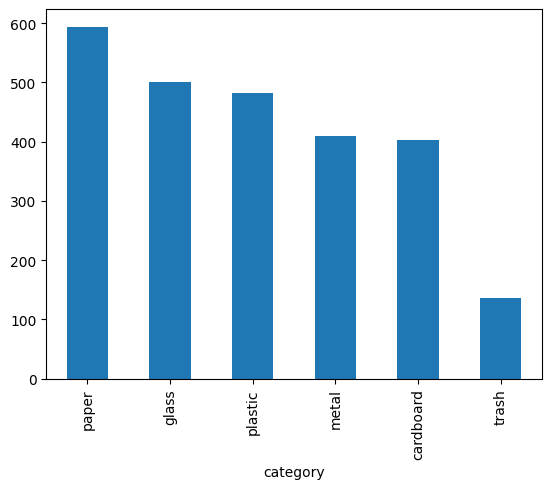

In [8]:
# summarize all data
print(f"\nTotal: {img_df['category'].value_counts()}\n")

img_df = img_df.sample(frac=1).reset_index(drop=True)

img_df['category'].value_counts().plot(kind='bar')

The data has slight class imbalances, but not very large.

- The smallest class is trash category, which might then benefit from more augmentation, such as horizontal/vertical flips, color jitter, brightness/contrast tweaks, random cropping/zooming, and rotation
- Paper class has the largest amount of data, which can lead to imbalanced predictive power of the model. We can perform undersampling on this class to make it more balanced with the other classes.

## Size/Aspect Ratio per Class

In [9]:
def compute_image_info(df):
    df[['width', 'height', 'aspect_ratio']] = df['images'].apply(get_image_info)
    return df

def get_stats_by_class(df, label_col='category'):
    stats_df = df.groupby(label_col).agg({
        'width': ['mean', 'std', 'min', 'max', 'var'],
        'height': ['mean', 'std', 'min', 'max', 'var'],
        'aspect_ratio': ['mean', 'std', 'min', 'max', 'var']
    })

    return stats_df

df = compute_image_info(img_df)
stats_by_class = get_stats_by_class(img_df, label_col='category')
display(stats_by_class)

width                         height                          \
            mean  std    min    max  var   mean  std    min    max  var   
category                                                                  
cardboard  512.0  0.0  512.0  512.0  0.0  384.0  0.0  384.0  384.0  0.0   
glass      512.0  0.0  512.0  512.0  0.0  384.0  0.0  384.0  384.0  0.0   
metal      512.0  0.0  512.0  512.0  0.0  384.0  0.0  384.0  384.0  0.0   
paper      512.0  0.0  512.0  512.0  0.0  384.0  0.0  384.0  384.0  0.0   
plastic    512.0  0.0  512.0  512.0  0.0  384.0  0.0  384.0  384.0  0.0   
trash      512.0  0.0  512.0  512.0  0.0  384.0  0.0  384.0  384.0  0.0   

          aspect_ratio                                
                  mean  std       min       max  var  
category                                              
cardboard     1.333333  0.0  1.333333  1.333333  0.0  
glass         1.333333  0.0  1.333333  1.333333  0.0  
metal         1.333333  0.0  1.333333  1.333333  0.0  
paper         1.333333  0.0  1.333333  1.333333  0.0  
plastic       1.333333  0.0  1.333333  1.333333  0.0  
trash         1.333333  0.0  1.333333  1.333333  0.0

All images have consistent sizes and aspect ratio, across all classes, with zero variances

## Visual Analysis per Class

### Paper

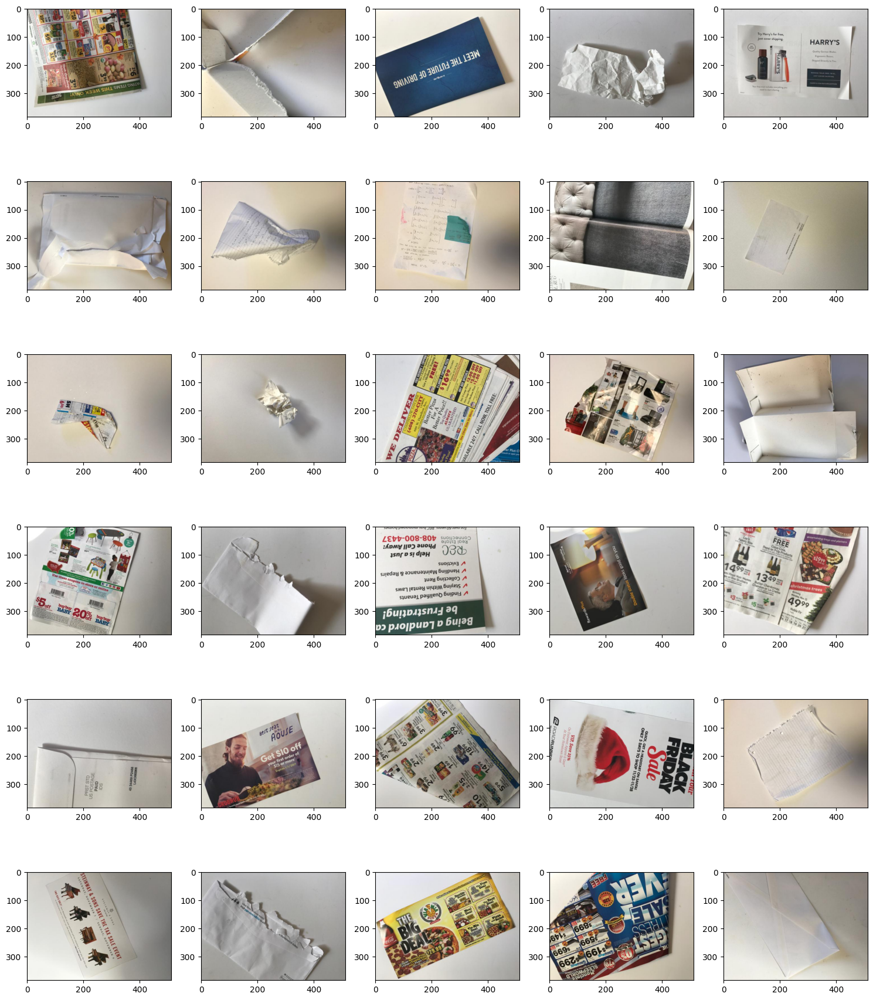

In [10]:
paper_df = img_df[img_df['category'] == 'paper'].copy()
show_samples(paper_df)

| <ul>Aspect</ul> | <ul>Observation</ul> |
|-------------------------|------------------------------|
| <ul>Shape/content</ul> | <ul><li>Mostly recyclable documents, magazines, flyers, envelopes in flat rectangular shape made out of paper</li></ul> |
| <ul>Size</ul> | <ul><li>All the sample images in paper class have been standardized to be of the same size (~400x500)</li></ul> |
| <ul>Color</ul> | <ul><li>All RGB, with predominantly white or light-colored papers</li><li>Some containing colorful text and images</li></ul> |
| <ul>Lighting & Background</ul> | <ul><li>Lighting is consistent, with most images shot on a clean white or neutral background</li></ul> |
| <ul>Orientation & Angle</ul> | <ul><li>Varies across images — includes top-down, angled, and slightly rotated shots</li></ul> |
| <ul>Texture & Condition</ul> | <ul><li>Mixture of smooth, flat papers and crumpled, torn, or folded sheets</li></ul> |
| <ul>Object Size in Frame</ul> | <ul><li>Papers generally take up a large portion of the frame, though a few are off-center or smaller</li></ul> |
| <ul>Noise / Distractions</ul> | <ul><li>Minimal distractions. The focus is solely on the item</li><li>There are occasional shadows, but backgrounds are clean</li></ul> |
| <ul>Class Consistency</ul> | <ul><li>High consistency</li><li>Variations are present mainly in texture and angles</li></ul> |

***Action Plans***

Dataset is fairly clean — light preprocessing and standardization should suffice

- Resizing / Cropping:
  - Resize or center-crop to reduce the impact of size variation and off-center shots

- Rotation Augmentation:
  - Apply slight random rotations to help the model generalize to angled papers

- Brightness Augmentation:
  - Improve robustness under different lighting conditions

- Texture-Based Features:
  - For fine-grained classification (e.g., distinguishing cardboard from thin paper)


### Glass

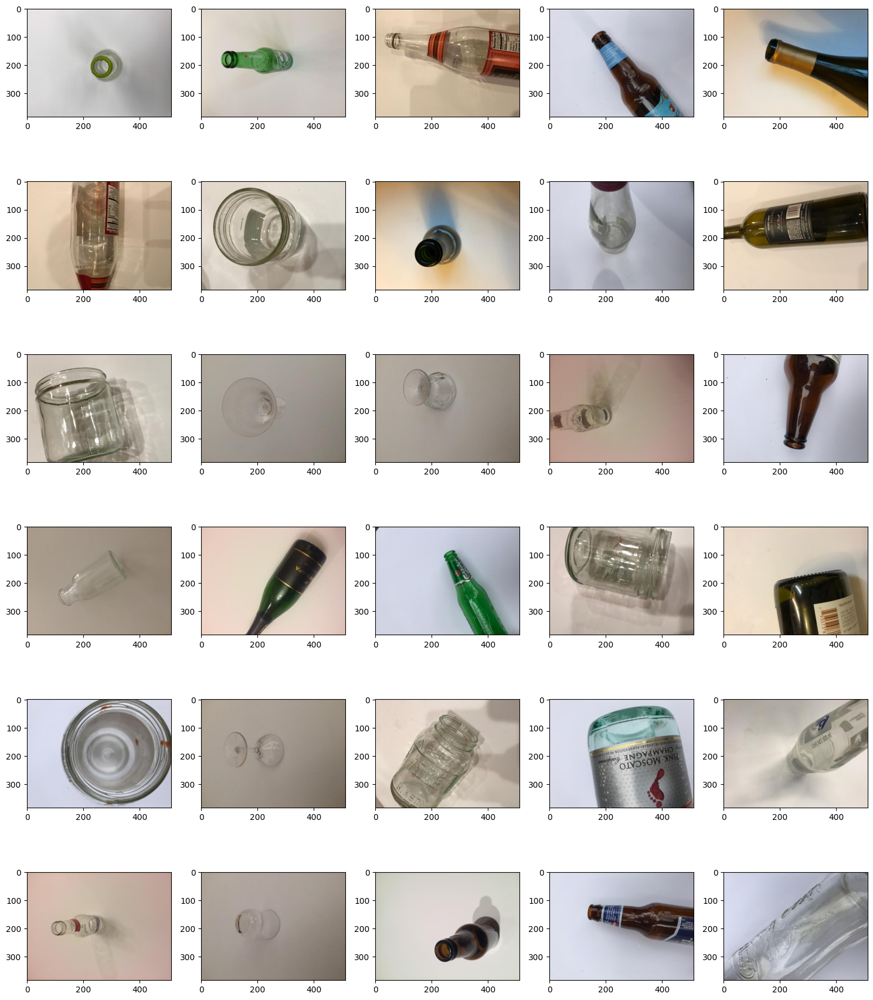

In [11]:
glass_df = img_df[img_df['category'] == 'glass'].copy()
show_samples(glass_df)

***Visual Analysis Summary***

| <ul>Aspect</ul> | <ul>Observation</ul> |
|-------------------------|------------------------------|
| <ul>Shape/content</ul> | <ul><li>Recyclable bottles, jars, glasses, vials, all made of glass</li><li>Mostly distinguishable through the reflective properties</li></ul> |
| <ul>Size</ul> | <ul><li>All the sample images in this class have been standardized to be of the same size (~400x500)</li></ul> |
| <ul>Color</ul> | <ul><li>All in RGB: transparent, green, brown</li><li>Some reflective highlights due to lighting</li></ul> |
| <ul>Lighting & Background</ul> | <ul><li>Backgrounds are mostly white or light beige</li><li>Some shadows and reflections from glass surface</li></ul> |
| <ul>Orientation & Angle</ul> | <ul><li>Wide variation: top-down, side view, diagonal, rotated</li></ul> |
| <ul>Texture & Condition</ul> | <ul><li>All objects are hard, reflective surfaces; some minor scratches or labels</li></ul> |
| <ul>Object Size in Frame</ul> | <ul><li>Most objects occupy a large portion of the frame</li><li>Some are zoomed out or off-center</li></ul> |
| <ul>Noise / Distractions</ul> | <ul><li>Some background shadows and table edges are visible</li><li>Lighting reflections on glass can obscure detail</li></ul> |
| <ul>Class Consistency</ul> | <ul><li>Very high visual consistency – all objects clearly belong to the glass category</li><li>Variation is mostly in color and orientation</li></ul> |

***Action Plans***
- Standardize Object Position:
  - Crop or center-align glass objects to reduce variation in object placement.

- Normalize Lighting:
  - Light augmentations to reduce the impact of shadows and reflections.

- Rotation Augmentation:
  - Use random rotations to help model generalize across many object angles.

- Background Consistency:
  - Augment some images to mask or remove background of clutter and shadows.

### Plastic

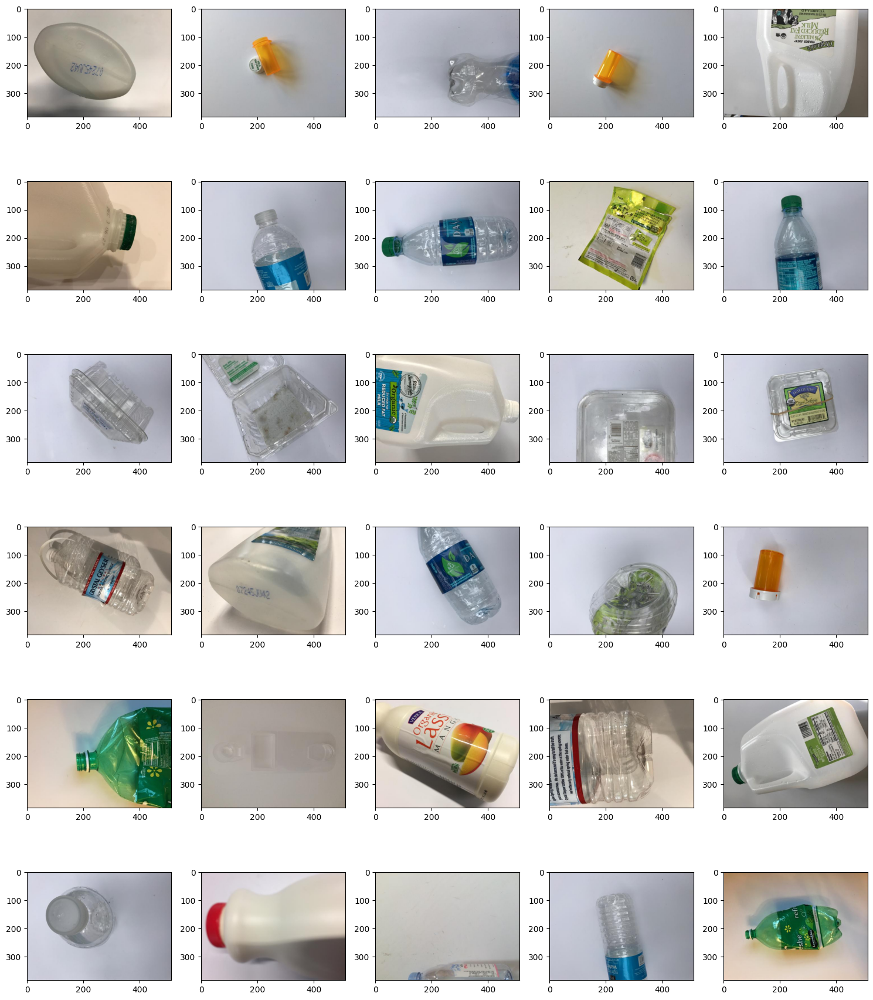

In [12]:
plastic_df = img_df[img_df['category'] == 'plastic'].copy()
show_samples(plastic_df)

***Visual Analysis Summary***

| <ul>Aspect</ul> | <ul>Observation</ul> |
|-------------------------|------------------------------|
| <ul>Shape/Content</ul> | <ul><li>Wide variety of shapes on plastic materials</li><li>includes shapes of plastic bottles, containers, jugs, food packaging, wrappers, and trays</li><li>Might introduce confusability with glass bottles</ul> |
| <ul>Size</ul> | <ul><li>All the sample images in this class have been standardized to be of the same size (~400x500)</li></ul> |
| <ul>Color</ul> | <ul><li>Mostly transparent or translucent plastic</li><li>Some colored plastics (green, yellow, blue), often with bright labels</li></ul> |
| <ul>Lighting & Background</ul> | <ul><li>Mostly white backgrounds with consistent lighting</li><li>Some shadows, slight color temperature differences</li></ul> |
| <ul>Orientation & Angle</ul> | <ul><li>Wide range of orientations — top-down, side views, tilted, upside down</li><li>Some objects rotated in odd angles</li></ul> |
| <ul>Texture & Condition</ul> | <ul><li>Variety of textures: smooth bottles, crinkled wrappers, ridged containers</li><li>Several crushed or distorted plastic forms</li></ul> |
| <ul>Object Size in Frame</ul> | <ul><li>Medium to large object occupancy</li><li>Some are zoomed in or cropped; others are far or partially out of frame</li></ul> |
| <ul>Noise / Distractions</ul> | <ul><li>Minimal clutter; some shadows or table edges visible</li><li>Reflections on glossy plastic surfaces present</li></ul> |
| <ul>Class Consistency</ul> | <ul><li>Moderate intra-class variation due to many types of plastic items</li><li>Variations mainly in shape, angles, texture, object size</li></ul> |

***Action Plans***
- Rotation Augmentation:
  - Use random rotations during training to address highly varied object angles.

- Class Sub-labeling:
  - If performance suffers, consider sub-grouping bottles vs wrappers vs containers.

- Normalize Object Size:
  - Apply resizing or center cropping to reduce variation in object framing.

- Reduce Reflection Noise:
  - Light contrast adjustment or histogram equalization may help mitigate strong highlights.

- Enhance Label Robustness:
  - Use color jitter or brightness augmentation to generalize across label types and packaging styles.

### Metal

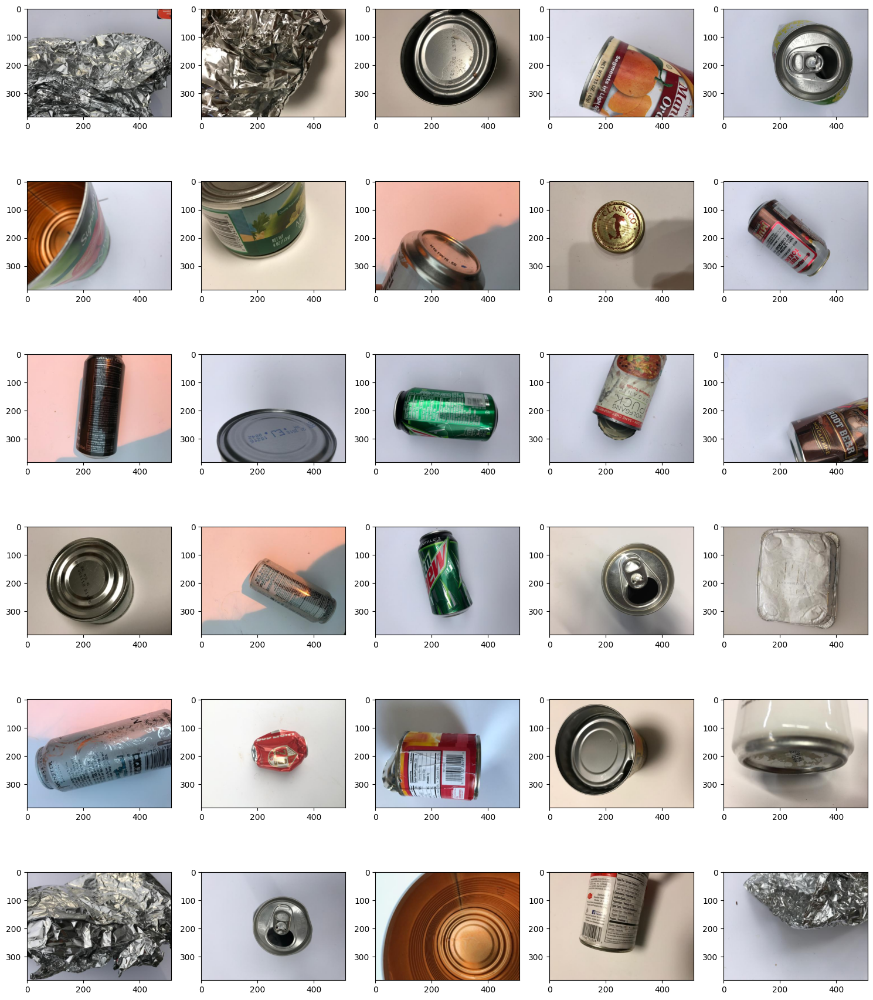

In [13]:
metal_df = img_df[img_df['category'] == 'metal'].copy()
show_samples(metal_df)

***Visual Analysis Summary***

| <ul>Aspect</ul> | <ul>Observation</ul> |
|-------------------------|------------------------------|
| <ul>Shape/Content</ul> | <ul><li>Primarily recyclable aluminum cans, tin lids, crushed cans, foil, and food tins</li></ul> |
| <ul>Size</ul> | <ul><li>All the sample images in this class have been standardized to be of the same size (~400x500)</li></ul> |
| <ul>Color</ul> | <ul><li>Mostly silver/metallic with some colored branding (e.g., red, green, yellow)</li><li>Strong specular highlights on many surfaces</li></ul> |
| <ul>Lighting & Background</ul> | <ul><li>Neutral to warm backgrounds (white, beige)</li><li>Strong lighting reflections on metallic surfaces</li></ul> |
| <ul>Orientation & Angle</ul> | <ul><li>Many items are shown from top-down, side, or diagonal views</li><li>Crushed or distorted objects introduce irregular shapes</li></ul> |
| <ul>Texture & Condition</ul> | <ul><li>Varied: smooth polished lids, crumpled cans, wrinkled foil</li><li>Both intact and deformed items included</li></ul> |
| <ul>Object Size in Frame</ul> | <ul><li>Objects generally occupy a medium to large area of the frame</li><li>Some appear tightly cropped or rotated awkwardly</li></ul> |
| <ul>Noise / Distractions</ul> | <ul><li>Minimal distractions; slight shadows and reflections from the metal</li></ul> |
| <ul>Class Consistency</ul> | <ul><li>Moderately consistent – all are clearly metallic but vary in shape, texture, and color</li><li>Some overlap in visual style with plastic cans (e.g. soda cans)</li></ul> |

***Action Plans***
- Reflection Control:
  - Augmentations like contrast normalization or blur to mitigate sharp lighting reflections.

- Shape variance:
  - Use deformation-aware augmentations to improve model robustness to crushed forms.

- Rotation Augmentation:
  - This is needed due to varied camera angles and asymmetrical object positioning.

- High-Frequency Detail Preservation:
  - Ensure that image resizing or augmentation does not blur out metallic texture details, which is key characteristics of metal class images.

### Cardboard

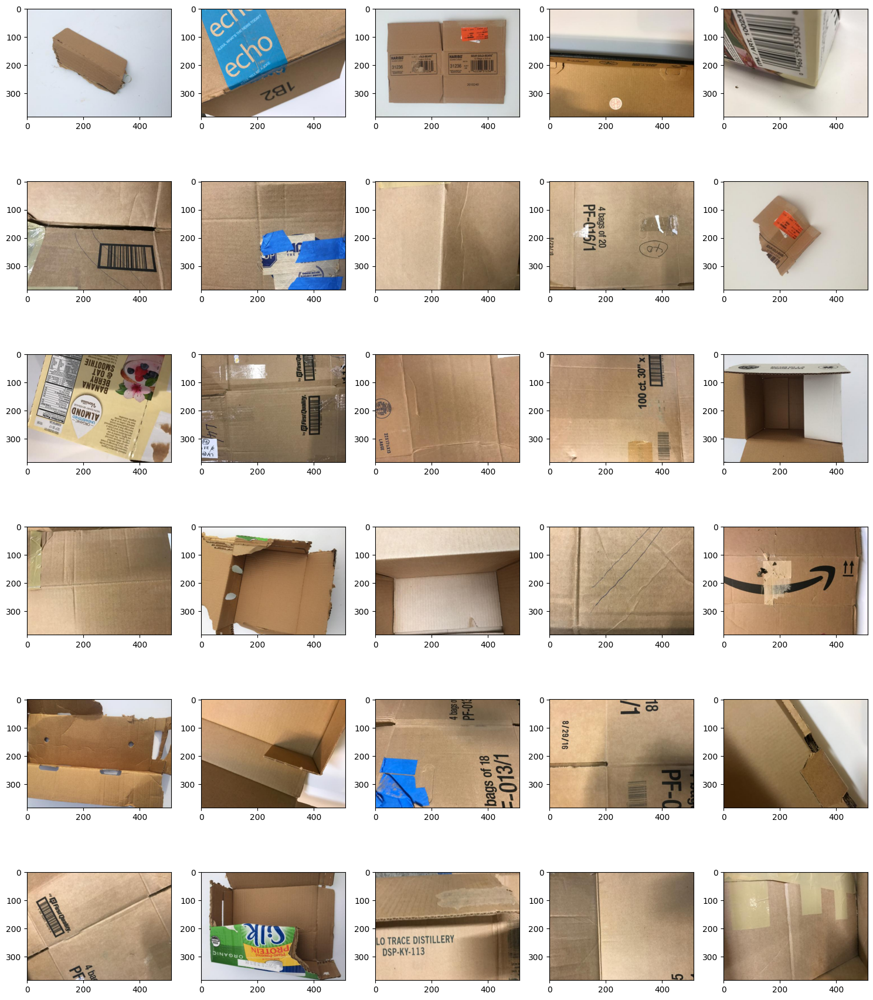

In [14]:
cardboard_df = img_df[img_df['category'] == 'cardboard'].copy()
show_samples(cardboard_df)

***Visual Analysis Summary***

| <ul>Aspect</ul> | <ul>Observation</ul> |
|-------------------------|------------------------------|
| <ul>Shape/Content</ul> | <ul><li>Flattened recylable boxes, packaging pieces, corrugated cardboard sheets</li><li>Some labeled, printed, or branded surfaces</li></ul> |
| <ul>Size</ul> | <ul><li>All the sample images in this class have been standardized to be of the same size (~400x500)</li></ul> |
| <ul>Color</ul> | <ul><li>Predominantly brown, with some print, labels, tape, and markings</li></ul> |
| <ul>Lighting & Background</ul> | <ul><li>Mostly white or neutral backgrounds</li><li>Some light shadows, fairly consistent lighting</li></ul> |
| <ul>Orientation & Angle</ul> | <ul><li>Flat, tilted, side views — various orientations</li><li>Some are zoomed or rotated</li></ul> |
| <ul>Texture & Condition</ul> | <ul><li>Varies from flat and clean to torn, wrinkled, bent, or damaged</li></ul> |
| <ul>Object Size in Frame</ul> | <ul><li>Most take up a large portion of the frame, even not showing its full shape</li><li>A few are cropped or angled off-frame</li></ul> |
| <ul>Noise / Distractions</ul> | <ul><li>Minimal clutter</li><li>Occasional branding, printed text, colored tape, or packaging design</li></ul> |
| <ul>Class Consistency</ul> | <ul><li>Very consistent visually; distinguishable by its color & texture</li><li>Some variability in print and wear</li></ul> |

***Action Plans***
Minimal adjustments needed: Very clean and visually consistent class

- Light rotation and texture augmentations:
  - May help with bent/torn pieces.

- Augmentation to reduce object size in frame:
  - Most of the samples show images that are scaled so big that it fills the entire frame

- Masking:
  - Blur or mask text to make processing clearer

- Pose normalization:
  - Cropping or standardizing orientation.

### Trash

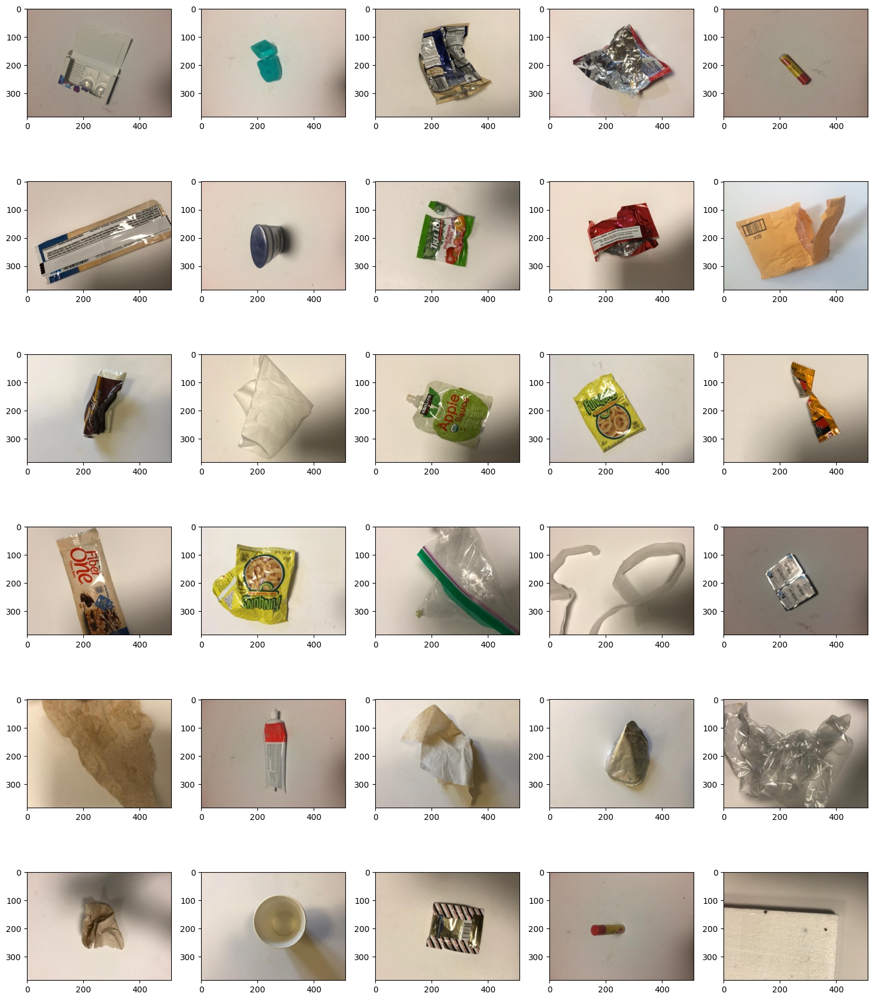

In [15]:
trash_df = img_df[img_df['category'] == 'trash'].copy()
show_samples(trash_df)

***Visual Analysis Summary***

| <ul>Aspect</ul> | <ul>Observation</ul> |
|-------------------------|------------------------------|
| <ul>Shape/Content</ul> | <ul><li>Mostly represents contaminated materials with residuals that can't be recycled</li><li>Includes dirty tissues, food wrappers, crumpled foil, Ziploc bags, snack packaging</li></ul> |
| <ul>Size</ul> | <ul><li>All the sample images in this class have been standardized to be of the same size (~400x500)</li></ul> |
| <ul>Color</ul> | <ul><li>Wide color variation — white, brown, silver, red, green</li><li>Some transparent or semi-transparent items</li></ul> |
| <ul>Lighting & Background</ul> | <ul><li>Warm indoor lighting with some yellowish cast</li><li>Shadows and uneven lighting are present</li></ul> |
| <ul>Orientation & Angle</ul> | <ul><li>Mostly top-down and flat, but with high variation in pose</li></ul> |
| <ul>Texture & Condition</ul> | <ul><li>Crinkled, soft, greasy, torn — high textural diversity</li></ul> |
| <ul>Object Size in Frame</ul> | <ul><li>Mostly medium to small items in frame</li><li>Often centered, sometimes partially out of frame</li></ul> |
| <ul>Noise / Distractions</ul> | <ul><li>Some clutter in background, shadows, and lighting inconsistencies</li></ul> |
| <ul>Class Consistency</ul> | <ul><li>Low consistency — includes various unrelated objects all considered “trash”</li><li>More of a catch-all class for those that does not belong to the other classes</li></ul> |

***Action Plans***
- Split or reclassify:
  - Ideally, this class can be re-classified into sub-classes, such as tissues, contaminated packaging, organic materials, biohazardous residuals, etc. to improve consistency. However, due to the scope of the project and time limitation, we will be keeping this class as-is, and add this as next improvement point.

- Lighting normalization:
  - Do color correction due to mainly warm lighting and yellowish casts.

- Increase sample diversity:
  - Do robust augmentations to include more examples of other types of trash to balance representation.

## Brightness Distribution per Class

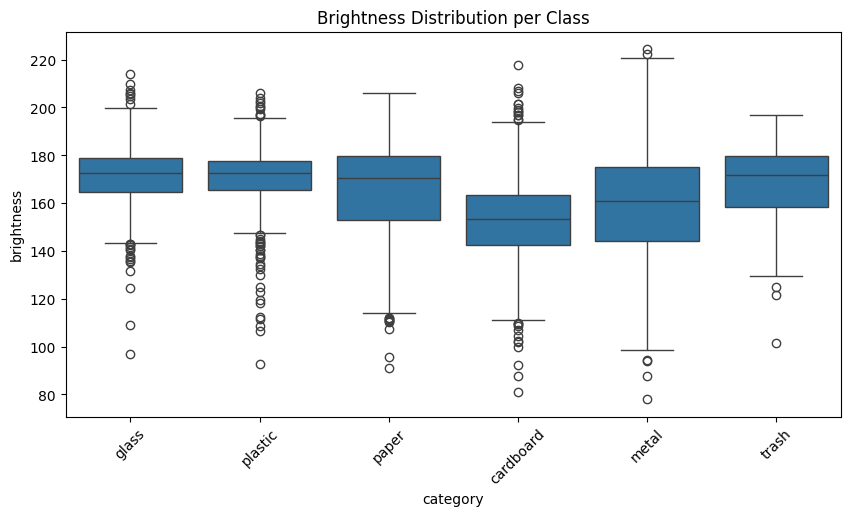

In [16]:
img_df['brightness'] = img_df['images'].apply(get_brightness)

plt.figure(figsize=(10, 5))
sns.boxplot(data=img_df, x='category', y='brightness')
plt.xticks(rotation=45)
plt.title('Brightness Distribution per Class')
plt.show()

***Key Insights***
- Brightness varies across classes, but they are overlapping: means that no single class has a completely distinct brightness profile.
- Metal and cardboard have the widest range of brightness, including dark and very bright images, which might indicate more lighting variations.
- Plastic, glass, paper, and trash have tighter distributions with more consistent brightness values.
- Cardboard has the lowest median brightness, possibly due to majority brown/dull color tones.
- Plastic and glass have higher median brightness — possibly due to more shiny, reflective surfaces or bright-colored items.
- There are outliers (in both sides) in all categories — which suggests that some images are either overexposed or underexposed, and we may benefit from brightness augmentation.

***Takeaways***:
-  We can use brightness augmentation to improve generalization of the images and reduce outliers.

## Inter-Class Confusability

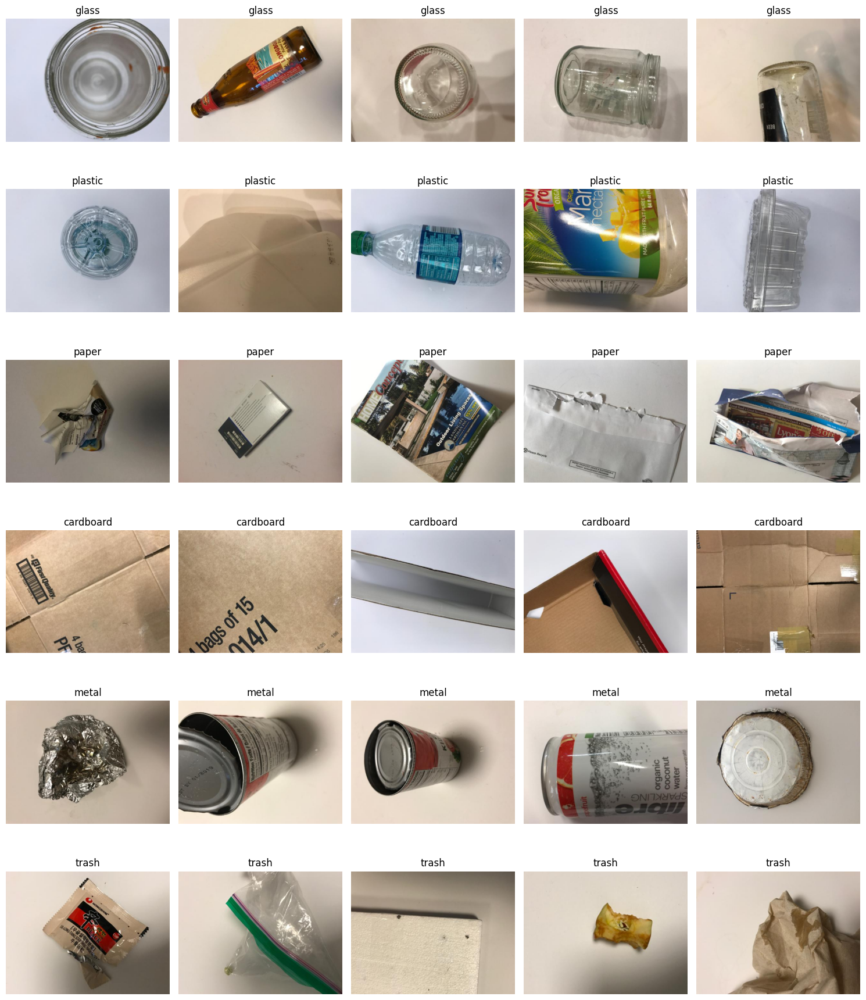

In [17]:
compare_multiple_classes(img_df, list(img_df.category.unique()))

***Potential Confusability***

1. Glass vs Plastic: A transparent PET bottle and a glass bottle can look almost identical without close texture cues
  - Shape: The shapes of glass vs plastic bottles might be visually similar on some cases
  - Transparency: Clear plastic and glass look very similar, especially with strong lighting
  - Branding/labels: Soda or water bottles have similar label placements

2. Paper vs Trash: A crumpled paper might look like tissue paper or vice versa
  - Tissues, napkins, wrappers could be classified as either — especially when torn or dirty

Some potential actions:
- Add texture-preserving augmentations (glass reflects more; plastic distorts more when squeezed)
- Put more attention to these during evaluation: in confusion matrix and misclassification evalutaion, are glass/plastic or paper/trash being confused?






## Data Quality Issues Analysis

Here we will be doing quick check if there are images with:

- Duplicated images
- Very small size
- Very large size
- Weird aspect ratios
- Blurry Images

In [18]:
# Check for very small images
img_df[['width', 'height', 'aspect_ratio']] = img_df['images'].apply(get_image_info)
small_img = img_df[(img_df['width'] < 100) | (img_df['height'] < 100)]
print(f'Very small images = {len(small_img)}')

# Check for large images
large_img = img_df[(img_df['width'] > 512) | (img_df['height'] > 512)]
print(f'Large images = {len(large_img)}')

# Check for large pixel images
img_df['pixel_count'] = img_df['width'] * img_df['height']
too_large = img_df[img_df['pixel_count'] > 512*512]
print(f'Too large images = {len(too_large)}')

# Check for weirdly shaped images
weirdly_shaped_img = img_df[(img_df['aspect_ratio'] > 3)]
print(f'Weirdly shaped images = {len(weirdly_shaped_img)}')

# Check for blurry images
img_df['sharpness'] = img_df['images'].apply(detect_blur)
blur_threshold = 30
blurry_images = img_df[img_df['sharpness'] < blur_threshold]
print(f'Blurry Images = {len(blurry_images)}')

# Check for duplicated images
columns_to_ignore = ['images']
columns_to_check = [col for col in img_df.columns if col not in columns_to_ignore]
duplicate_rows = img_df[img_df.duplicated(subset=columns_to_check, keep=False)]
print(f'Duplicated images = {len(duplicate_rows)}')

Very small images = 0
Large images = 0
Too large images = 0
Weirdly shaped images = 0
Blurry Images = 255
Duplicated images = 0


No issues except for several blurry images.

Let's check and confirm which classes the blurred image belongs to, and how blurry these images are

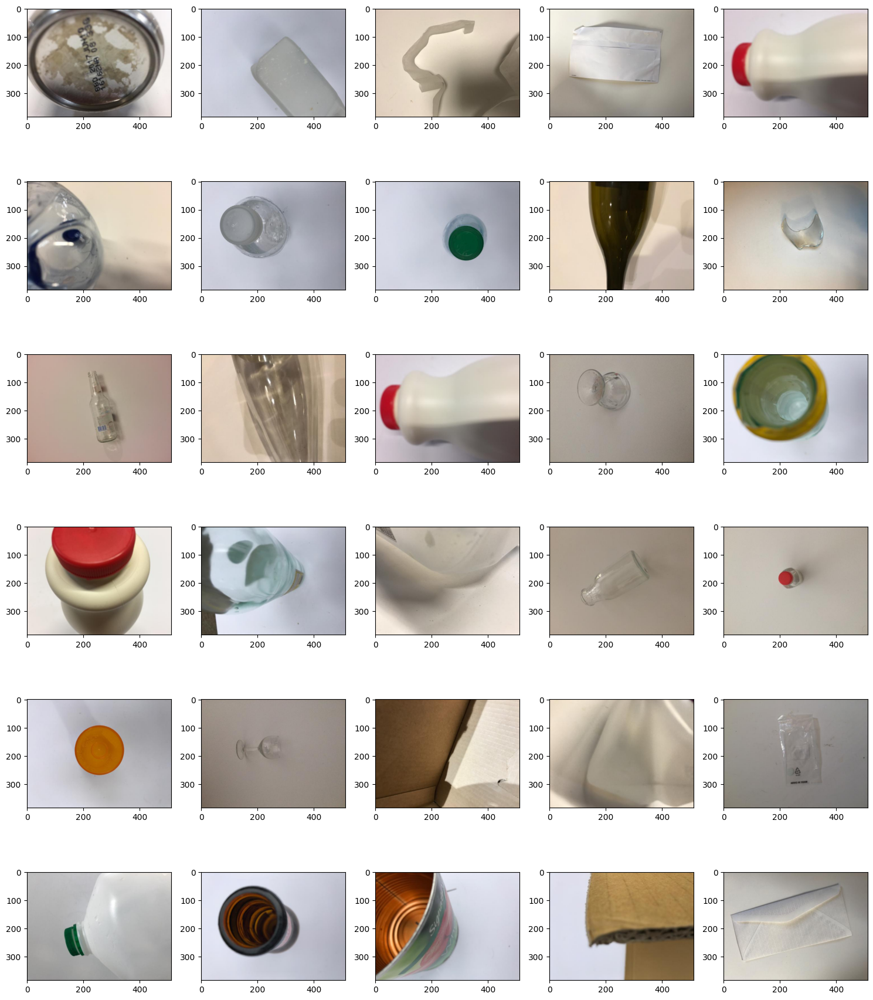

In [19]:
# visualize blurry images
show_samples(blurry_images, None, 30)

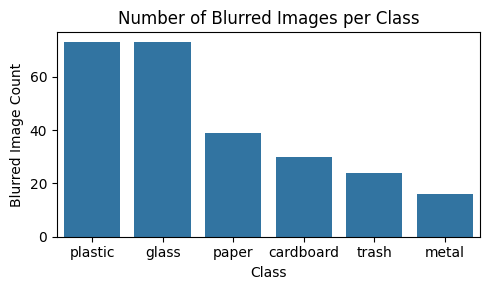

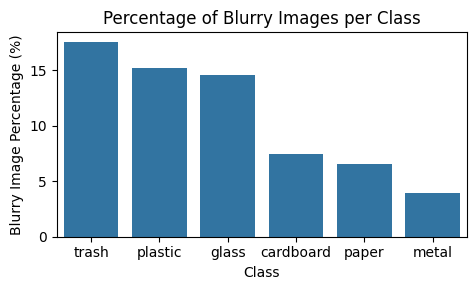

In [ ]:
blurred_counts = blurry_images['category'].value_counts()
total_per_class = img_df['category'].value_counts().sort_index()
blurry_per_class = blurry_images['category'].value_counts().reindex(total_per_class.index, fill_value=0)
sharp_per_class = total_per_class - blurry_per_class
blur_percentage = (blurry_per_class / total_per_class) * 100

plotBarChart((5,3), blurred_counts.index, blurred_counts.values, 'Number of Blurred Images per Class', 'Class', 'Blurred Image Count')
print('\n')
plotBarChart((5,3), blur_percentage.sort_values(ascending=False).index, blur_percentage.sort_values(ascending=False).values, 'Percentage of Blurry Images per Class', 'Class', 'Blurry Image Percentage (%)')

Since the total quantity of dataset in plastic, glass, and trash classes are not very large, it is better to refrain from removing the dataset.

Since we plan to undersample paper (due to having much more data than other classes), we can *partially* remove these blurry images form the paper classes, leaving some for variation of dataset.

# Feature Engineering / Preprocessing

## Class Balancing

### Undersampling Blurry Paper Images

From the EDA section, we know that `paper` class has sizeably more number of images compared to the other classes (~100+ images more compared to the other classes). Hence, to reduce the risk of the model over-predicting this image and reduce class imbalance, we can do undersampling on this class.

However, since we know also from the EDA section that there are several number of images with low quality (blurry), it might be better that instead of doing random undersampling, we do the undersampling by removing some of these blurred images from the `paper` class instead. Hence it's tackling both issues: reduce class imbalance, and improve overall data quality.

Pre-filtering: 




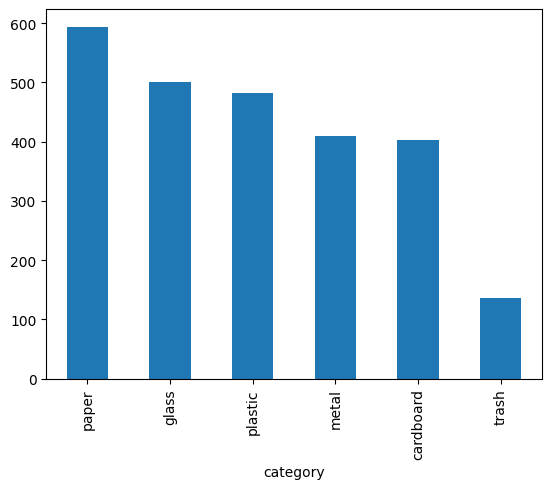

In [21]:
print('Pre-filtering: ')
len(img_df)
img_df['category'].value_counts().plot(kind='bar')

print('\n')

Post-filtering: 


<Axes: xlabel='category'>

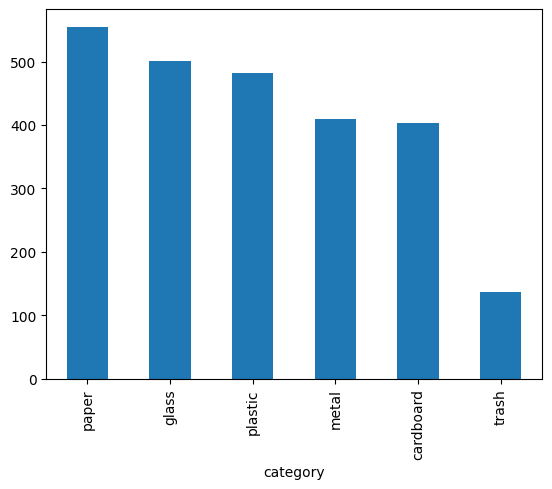

In [22]:
# remove blurry images from paper class below the blur threshold
img_df = img_df[~((img_df['category'] == 'paper') & (img_df['sharpness'] < blur_threshold))]
print('Post-filtering: ')
len(img_df)
img_df['category'].value_counts().plot(kind='bar')

### Oversampling Trash Images

We can see that `trash` is still underrepresented by quite a sizeable amount. This may lead to poor accuracy and conservative prediction for trash class. Due to this, we will do an oversampling for trash using simple image duplication.

<Axes: xlabel='category'>

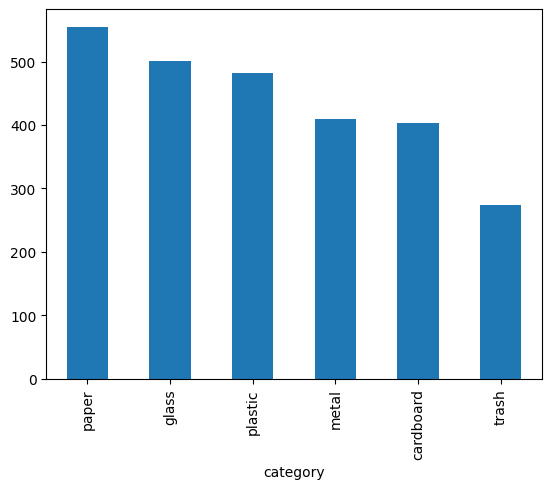

In [ ]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    fill_mode='nearest'
)

destination = f'{image_path}/augmented_trash'

if not os.path.exists(destination):
    os.makedirs(destination)

for image_file in trash_files:
    img = image.load_img(image_file)
    x = image.img_to_array(img)
    x = x.reshape((1,) + x.shape)

    i = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir=destination, save_format='jpeg'):
        i += 1
        if i >= 1:
            break

aug_trash_files = glob(f'{destination}/*')
aug_trash_df = pd.DataFrame({
    'images': aug_trash_files,
    'category': 'trash'
})
img_df = pd.concat([img_df, aug_trash_df], ignore_index=True)
img_df['category'].value_counts().plot(kind='bar')

Now we see that the trash class is slighly more balanced.

Although there are still slight imbalance compared to other classes, I chose NOT to oversample it further due to it being a `catch-all` class with high variability. If we oversample this class too much, it may lead to overprediction on this class and might make the model overpredict other classes as trash instead due to the high variability.

## Set Configurations

In [28]:
# declare configurations

BATCH_SIZE = 32 # default batch size
img_height = 224
img_width = 224
IMG_SIZE = (img_height, img_width)
SEED = 42
EPOCHS = 25
class_names = sorted(img_df['category'].unique())
np.random.seed(SEED)
tf.random.set_seed(SEED)

train_size = 0.8
val_size = 0.1
test_size = 0.1

## Split Train-Val-Test

We will now split the sample images into train, validation, and test set with the following split:
- 80% train
- 15% validation
- 5% test

Due to the small size of our dataset, this split is to ensure we have enough sample data for validation.

Step 1: Export Dataframe to Train vs Test Directory

In [29]:
# train_df will contain train & val data

train_val_df, test_df = train_test_split(img_df, test_size=0.05, stratify=img_df['category'], random_state=SEED) # split data to 95% train-val and 5% test

FINAL_DIR = '/content/model_dataset'
TRAIN_VAL_DIR = os.path.join(FINAL_DIR, 'train_val')
TEST_DIR = os.path.join(FINAL_DIR, 'test')

if os.path.exists(FINAL_DIR):
    shutil.rmtree(FINAL_DIR)
    print(f"Folder {FINAL_DIR} removed.")

for class_name in img_df['category'].unique():
    os.makedirs(os.path.join(TRAIN_VAL_DIR, class_name), exist_ok=True)
    os.makedirs(os.path.join(TEST_DIR, class_name), exist_ok=True)

# copy train images
for _, row in train_val_df.iterrows():
    src = row['images']
    dst = os.path.join(TRAIN_VAL_DIR, row['category'], os.path.basename(src))
    shutil.copy(src, dst)

# copy test images
for _, row in test_df.iterrows():
    src = row['images']
    dst = os.path.join(TEST_DIR, row['category'], os.path.basename(src))
    shutil.copy(src, dst)

print("Dataset split from DataFrame to Directory completed!")

Dataset split from DataFrame to Directory completed!


Step 2: load into tf and split test_val into val and test

In [30]:
tf.keras.backend.clear_session()
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_VAL_DIR,
    validation_split=0.15, # total split from original dataset = 80% train, 15% val, 5% test
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_VAL_DIR,
    validation_split=0.15,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 2493 files belonging to 6 classes.
Using 2120 files for training.
Found 2493 files belonging to 6 classes.
Using 373 files for validation.
Found 132 files belonging to 6 classes.


## Data Augmentation

We will now perform augmentation to our image samples as follow-up action from our previous EDA section, and also due to the small size of our dataset. This augmentation process will help provide more variety and increse number of exposure to our model during training. So even though our dataset is limited and small, the model will be exposed to more data, using the same dataset but with slighly different versions. 

Due to limited time constraint, we will only perform 4 types of augmentation (rotation, zoom, contrast and brightness) for all the classes, but only applied to a randomly selected samples (this will help reduce training time but still give us the variety that we need).

The augmentation is then performed on-the-fly during each epochs of our training

In [31]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(factor=0.2),
])

def augment_some(x, y):
    if tf.random.uniform(()) > 0.5:
        x = data_augmentation(x, training=True)
    return x, y

train_ds_aug = train_ds.map(augment_some)

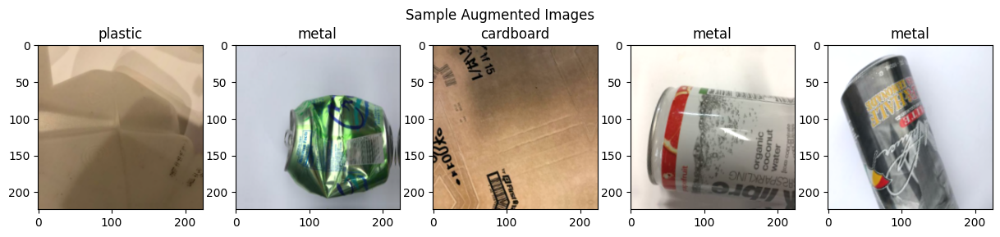

In [32]:
def show_augmented_batch(dataset, class_names, n=5):
    for images, labels in dataset.take(1):
        plt.figure(figsize=(15, 3))
        for i in range(n):
            ax = plt.subplot(1, n, i + 1)
            plt.imshow(tf.cast(images[i], tf.uint8))
            plt.title(class_names[labels[i]])
        plt.suptitle("Sample Augmented Images")
        plt.show()

show_augmented_batch(train_ds_aug, class_names)

# ANN Training

## Configs

Global Configurations

In [33]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=15)
]

In [34]:
def plot_training(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy')
    plt.plot(val_acc, label='Val Accuracy')
    plt.legend()
    plt.title('Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss')
    plt.plot(val_loss, label='Val Loss')
    plt.legend()
    plt.title('Loss')

    plt.show()

# ANN Training - Base

## Model Definition

In this initial model, I will be using:

- Sequential API due to the simple and small nature of the dataset (quite straight model with only 5 classes and limited samples, no major or complex parameters)
- Conv2D(32→64→128→256) adds complexity to the learning/training to our small dataset, in order to help increase accuracy
- GlobalAveragePooling to help overfitting by reducing number of parameters, especially helpful for small dataset
- Dense 256 & 128 makes a balance between learning power and overfitting control.

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 487,878 (1.86 MB)

 Trainable params: 487,878 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

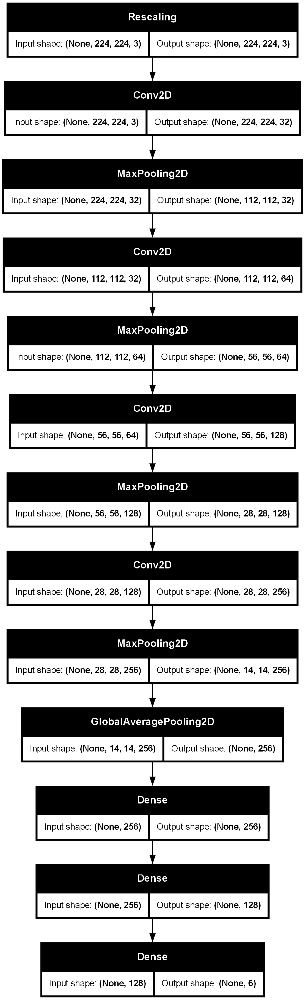

In [6]:
#BASE
tf.keras.backend.clear_session()
model_baseline = tf.keras.models.Sequential()
model_baseline.add(Input(shape=(224, 224, 3)))
# model_baseline.add(Input(shape=(img_height, img_width, 3)))
model_baseline.add(tf.keras.layers.Rescaling(1./255))
model_baseline.add(tf.keras.layers.Conv2D(32, (3,3), padding ='same', activation='relu'))
model_baseline.add(tf.keras.layers.MaxPooling2D(2, 2))
model_baseline.add(tf.keras.layers.Conv2D(64, (3,3), padding ='same', activation='relu'))
model_baseline.add(tf.keras.layers.MaxPooling2D(2, 2))
model_baseline.add(tf.keras.layers.Conv2D(128, (3,3), padding ='same', activation='relu'))
model_baseline.add(tf.keras.layers.MaxPooling2D(2, 2))
model_baseline.add(tf.keras.layers.Conv2D(256, (3,3), padding ='same', activation='relu'))
model_baseline.add(tf.keras.layers.MaxPooling2D(2, 2))
model_baseline.add(tf.keras.layers.GlobalAveragePooling2D())
model_baseline.add(tf.keras.layers.Dense(256, activation='relu'))
model_baseline.add(tf.keras.layers.Dense(128, activation='relu'))
model_baseline.add(tf.keras.layers.Dense(6, activation='softmax'))

# Compile
model_baseline.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

model_baseline.summary()
tf.keras.utils.plot_model(model_baseline, show_shapes=True)

## Model Training

In [36]:
%%time
history_baseline = model_baseline.fit(train_ds_aug, validation_data=val_ds, epochs=EPOCHS, callbacks=callbacks)

Epoch 1/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 33s 317ms/step - accuracy: 0.2153 - loss: 1.7725 - val_accuracy: 0.3137 - val_loss: 1.6372
Epoch 2/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.3662 - loss: 1.5871 - val_accuracy: 0.3619 - val_loss: 1.5569
Epoch 3/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.4102 - loss: 1.4491 - val_accuracy: 0.3995 - val_loss: 1.4447
Epoch 4/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - accuracy: 0.4240 - loss: 1.4089 - val_accuracy: 0.4879 - val_loss: 1.3545
Epoch 5/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - accuracy: 0.4388 - loss: 1.3380 - val_accuracy: 0.3861 - val_loss: 1.4643
Epoch 6/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - accuracy: 0.4839 - loss: 1.3306 - val_accuracy: 0.4745 - val_loss: 1.3154
Epoch 7/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.4942 - loss: 1.2414 - val_accuracy: 0.4772 - val_loss: 1.3284
Epoch 8/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.5298 - loss: 1.1936 - val_accu

## Model Evaluation

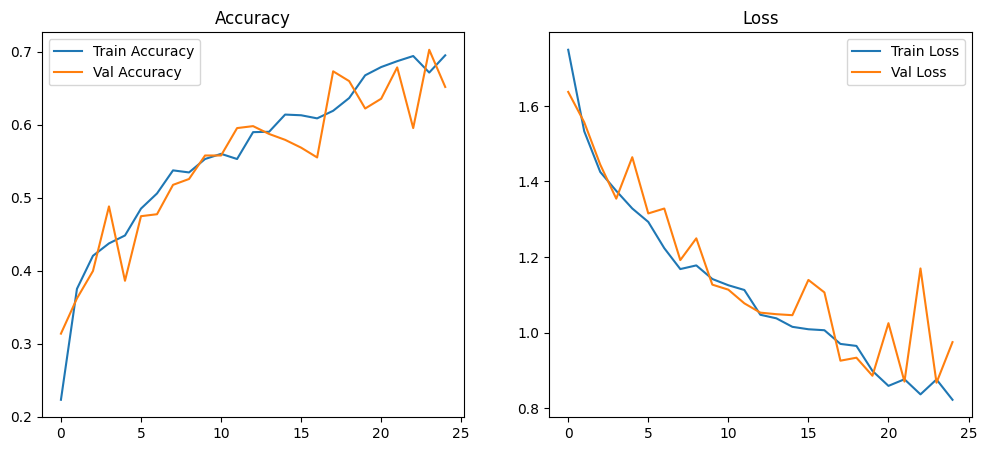

In [37]:
plot_training(history_baseline)

***Model Evaluation Summary***

Strengths:
- Training and validation accuracy are steadily improving
- Training loss is decreasing consistently

Weaknesses:
- Accuracy of both train and val is still below 70%
- Validation accuracy and loss are noisy and fluctuate a lot

Potential improvements:
- Reduce overfitting:
  - Add Dropout (e.g. 0.3) to help regularize & reduce overfitting
  - Since dataset size is small, perhaps there are too many / too deep layers in the model that 'forces' it to perform and result in overfitting. So reducing layers might help
- Increase accuracy:
  - Consider transfer learning

# ANN Training - Improvement

## Model Definition

In this improvement model, I will be making some changes compared to the previous model:

- Still a Sequential API, due to the simple and small nature of the dataset
- The base model will be using transfer learning from a pretrained model (since our dataset is small, it will hugely benefit from a pretrained model that has been exposed to much wider variety of data samples)
- Keep using GlobalAveragePooling to help overfitting by reducing number of parameters (especially helpful for small dataset)
- Change `Dense 256` layer to `Dense 32` to reduce overfitting since our last model shows sign of potential overfitting. This is because, although `Dense 256` might introduce more trainable params and helps with learning power, but with only 2.5k sample images, that extra capacity may lead the model to memorize training data rather than generalize the knowledge. So we want to just create a simpler model for our simple dataset (also considering that the base model is pretrained)
- Add `dropout` to reduce overfitting

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │          40,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             198 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,299,174 (8.77 MB)

 Trainable params: 41,190 (160.90 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

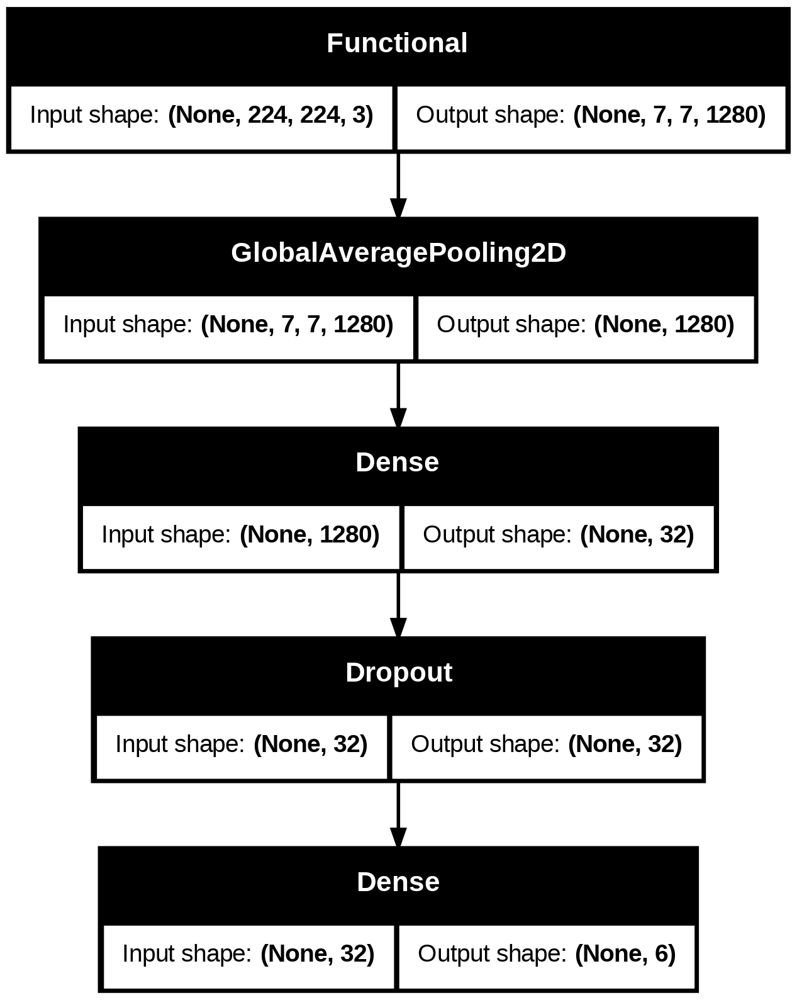

In [38]:
tf.keras.backend.clear_session()

base_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')
base_model.trainable = False

model_tuned = tf.keras.models.Sequential()
model_tuned.add(base_model)
model_tuned.add(tf.keras.layers.GlobalAveragePooling2D())
model_tuned.add(tf.keras.layers.Dense(32, activation='relu'))
model_tuned.add(tf.keras.layers.Dropout(0.3))
model_tuned.add(tf.keras.layers.Dense(6, activation='softmax'))

model_tuned.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

model_tuned.summary()
tf.keras.utils.plot_model(model_tuned, show_shapes=True)

## Model Training

In [39]:
history_tuned = model_tuned.fit(train_ds_aug, validation_data=val_ds, epochs=5)

Epoch 1/5
67/67 ━━━━━━━━━━━━━━━━━━━━ 44s 448ms/step - accuracy: 0.3219 - loss: 1.7034 - val_accuracy: 0.5040 - val_loss: 1.2901
Epoch 2/5
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.4993 - loss: 1.3038 - val_accuracy: 0.5469 - val_loss: 1.1830
Epoch 3/5
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - accuracy: 0.5413 - loss: 1.2153 - val_accuracy: 0.5791 - val_loss: 1.1086
Epoch 4/5
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - accuracy: 0.5654 - loss: 1.1515 - val_accuracy: 0.5630 - val_loss: 1.0853
Epoch 5/5
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - accuracy: 0.6115 - loss: 1.0884 - val_accuracy: 0.5818 - val_loss: 1.0562


### Fine-Tuning

Now we will unfreeze the pretrained model, enabling the layers of the pretrained model to be re-trained adjusting to our own dataset, to increase accuracy

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │          40,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             198 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,299,174 (8.77 MB)

 Trainable params: 2,265,062 (8.64 MB)

 Non-trainable params: 34,112 (133.25 KB)

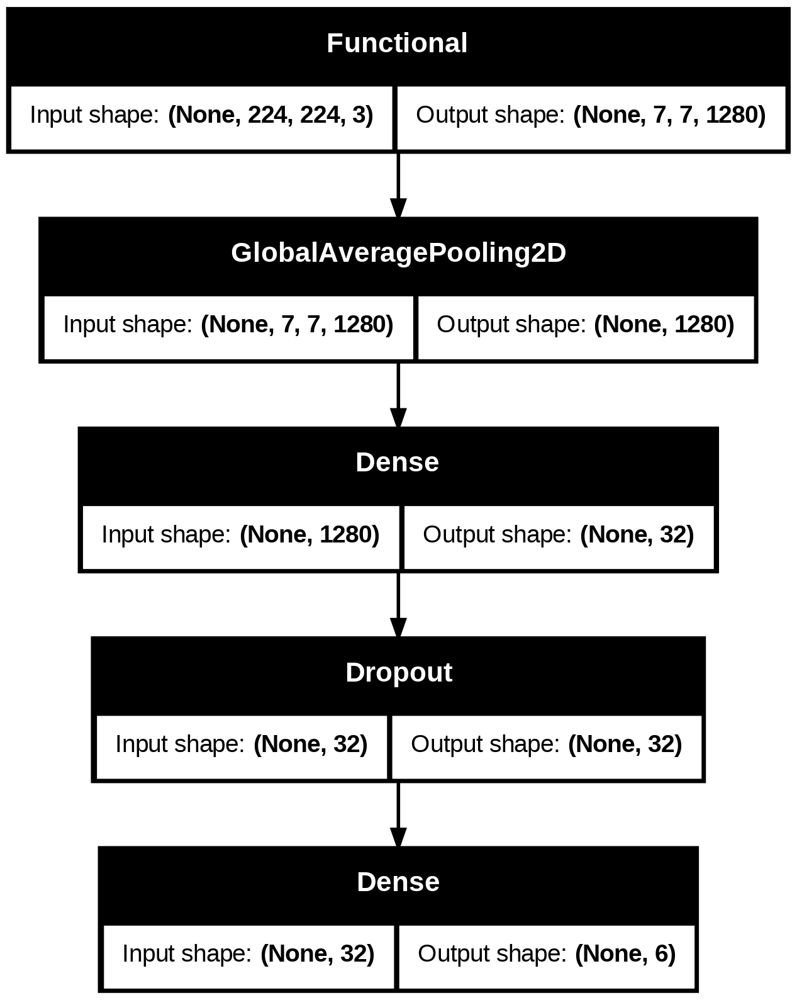

In [40]:
base_model.trainable = True

model_tuned.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

model_tuned.summary()
tf.keras.utils.plot_model(model_tuned, show_shapes=True)

### Re-training

In [41]:
%%time
history_finetuned = model_tuned.fit(train_ds_aug, validation_data=val_ds, epochs=EPOCHS, callbacks=callbacks)

Epoch 1/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 94s 601ms/step - accuracy: 0.2533 - loss: 2.2245 - val_accuracy: 0.4853 - val_loss: 1.5140
Epoch 2/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 170ms/step - accuracy: 0.4130 - loss: 1.5179 - val_accuracy: 0.4424 - val_loss: 1.6867
Epoch 3/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - accuracy: 0.5253 - loss: 1.2722 - val_accuracy: 0.4370 - val_loss: 1.6548
Epoch 4/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 170ms/step - accuracy: 0.5750 - loss: 1.1165 - val_accuracy: 0.4692 - val_loss: 1.5085
Epoch 5/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - accuracy: 0.6423 - loss: 1.0068 - val_accuracy: 0.5094 - val_loss: 1.3713
Epoch 6/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - accuracy: 0.6627 - loss: 0.9486 - val_accuracy: 0.5710 - val_loss: 1.2085
Epoch 7/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 170ms/step - accuracy: 0.6559 - loss: 0.9049 - val_accuracy: 0.6059 - val_loss: 1.1235
Epoch 8/25
67/67 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - accuracy: 0.6875 - loss: 0.8522 - val_accu

## Model Evaluation

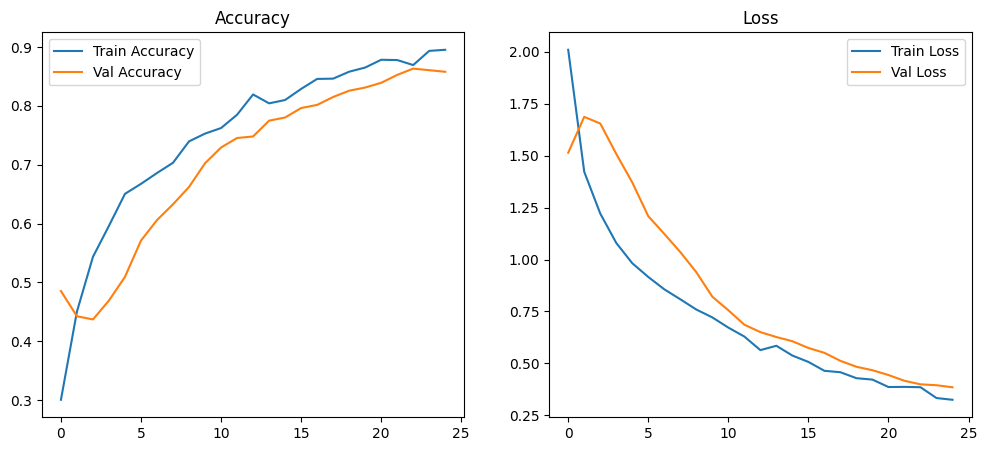

In [42]:
plot_training(history_finetuned)

***Model Evaluation Summary***

Strengths:
- Better accuracy (>85%) in both training and validation set compared to previous base model
- Both training and validation accuracy increase steadily
- Validation loss decreases consistently, which is a sign of great generalization
- As epoch progresses, gap between train and val seem to decrease, which means better fit as the model learns further
- Smoother training curve with less spikes or instability

Weaknesses:
- Slight plateuing on validation starting epoch 23, which is an early sign of overfitting, potentially can happen in the next 10 epochs.
  - Means that this model might not be able to generate much better accuracy by just adding more epochs, given that higher epochs than this might lead to overfitting

Potential improvements:
- Reduce overfitting:
  - Larger Dropout (e.g. 0.3) or L2 regularization to help regularize & reduce overfitting
- Increase accuracy:
  - Consider other transfer learning models
  - Since dataset is small, might also consider without transfer learning but do more trial errors with the number of layers

### Test Set Evaluation

In [44]:
loss, accuracy = model_tuned.evaluate(test_ds)
print(f"Test Accuracy: {accuracy:.4f}  |  Test Loss: {loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.8643 - loss: 0.4179
Test Accuracy: 0.8561  |  Test Loss: 0.4651


In [45]:
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model_tuned.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)

print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 756ms/step
Classification Report:
              precision    recall  f1-score   support

   cardboard       0.94      0.85      0.89        20
       glass       0.85      0.92      0.88        25
       metal       0.75      0.86      0.80        21
       paper       0.96      0.86      0.91        28
     plastic       0.79      0.79      0.79        24
       trash       0.86      0.86      0.86        14

    accuracy                           0.86       132
   macro avg       0.86      0.86      0.86       132
weighted avg       0.86      0.86      0.86       132



***Insights***

**Test result**

- Achieved 86% test accuracy — strong overall model performance despite some class imbalances.
- Cardboard & Paper: Both classes have very high precision with slighly lower recall, means that the model is highly confident and accurate for these but slightly underestimates the positive outcome for these classes: the model is more conservative in predicting cardboard and papers.
- Glass and metal have high recall but moderate precision, means that the model might be more overestimating positive outcome for this class. The model tends to overpredict this class — it finds almost all metal images but sometimes labels non-metal or non-glasses as metal or glasses (false positives).
- Plastic has the lowest overall score for all metrices means that the model mostly confuse this class with others. This might be linked to our previous confusability analysis during EDA where some glass and plastic might be confused due to similar shape (e.g bottles)

***Potential Next Steps***

- Apply class weighting to give more emphasis to underrepresented or difficult classes.
- Add augmentations or samples of plastic class to emphasize difference in texture and color with glass
- Continue training longer. Currently, the improved model was still rising in val accuracy around epoch 25 although with early signs of overfitting.

### Misclassification Analysis

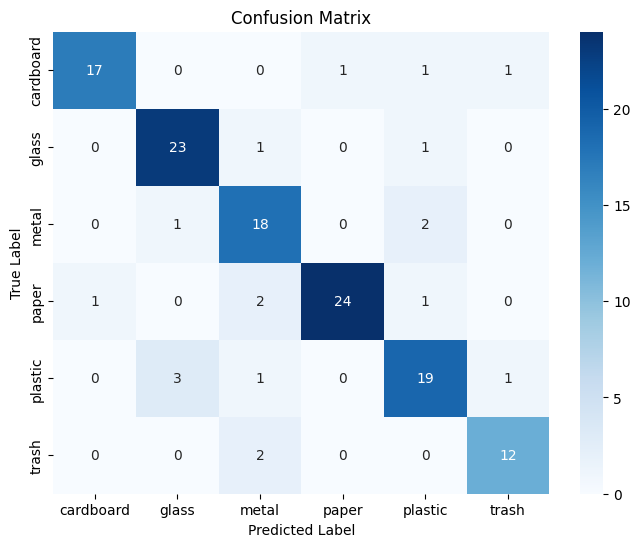

In [46]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

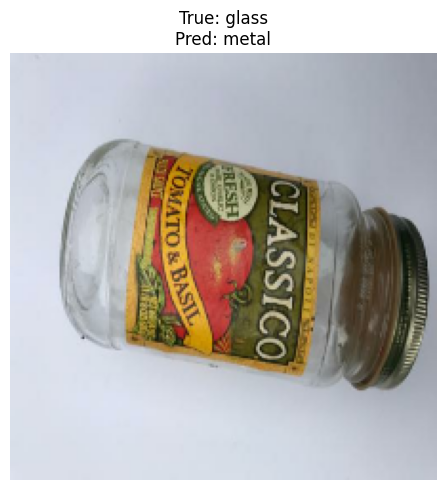

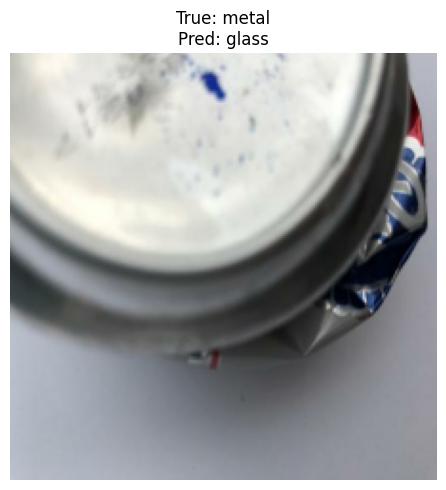

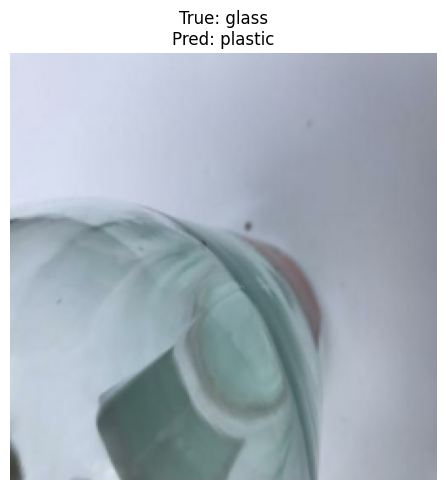

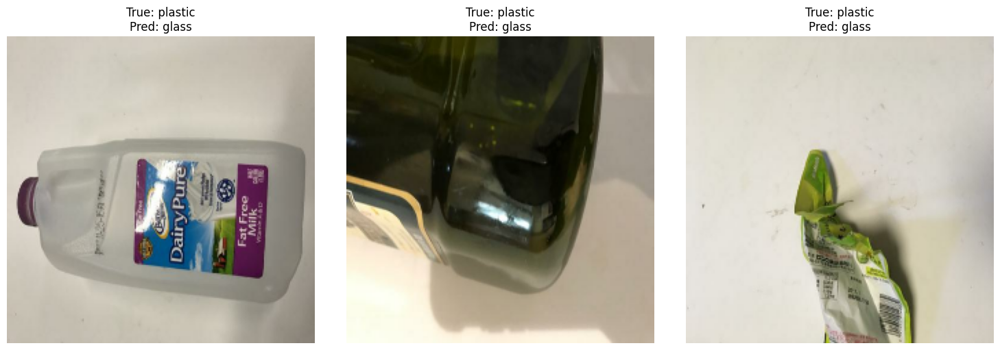

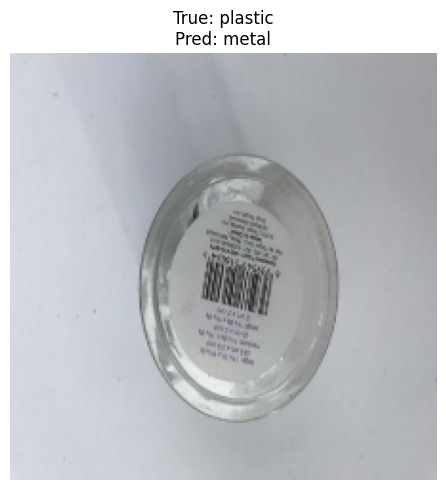

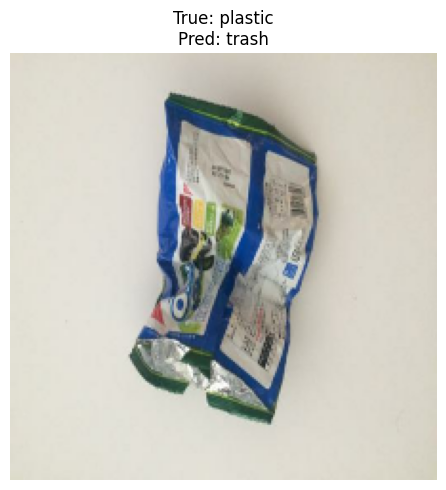

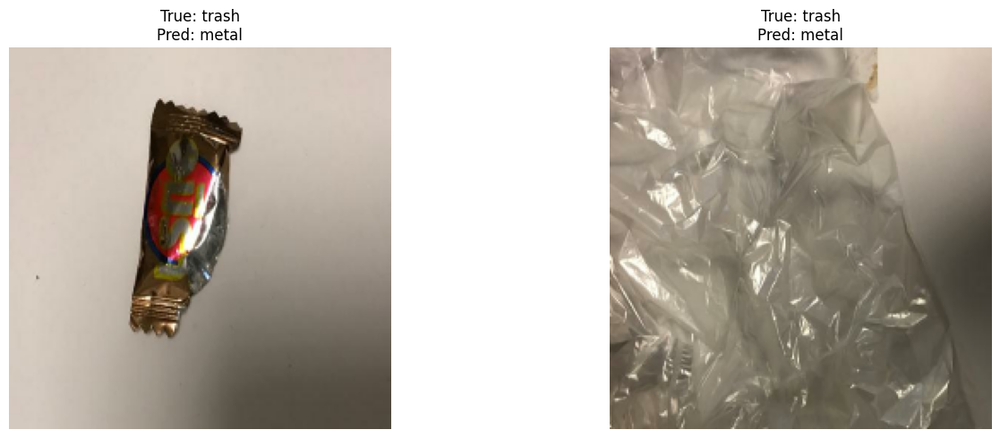

In [53]:
def show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class, predicted_class, no_images=5):
    """
    Display sample misclassified images from a given true class to a predicted class.
    """
    true_idx = class_names.index(true_class)
    pred_idx = class_names.index(predicted_class)

    indices = np.where((y_true == true_idx) & (y_pred == pred_idx))[0]

    if len(indices) == 0:
        print(f"No misclassified images from {true_class} → {predicted_class}")
        return

    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(indices[:no_images]):
        image_batch = list(test_ds.unbatch().skip(idx).take(1).as_numpy_iterator())[0][0]
        plt.subplot(1, min(no_images, len(indices)), i + 1)
        plt.imshow(image_batch.astype("uint8"))
        plt.title(f"True: {true_class}\nPred: {predicted_class}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="glass", predicted_class="metal", no_images=2)
show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="metal", predicted_class="glass", no_images=2)

show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="glass", predicted_class="plastic", no_images=2)
show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="plastic", predicted_class="glass", no_images=3)
show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="plastic", predicted_class="metal", no_images=1)
show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="plastic", predicted_class="trash", no_images=1)

show_misclassified_images(test_ds, y_true, y_pred, class_names, true_class="trash", predicted_class="metal", no_images=2)


**Misclassification analysis**

From the few sample images of misclassified objects, as per our confusability analysis in EDA section, it seems that the model is unable to distinguish:
  - Objects of similar shapes with different materials, such as plastic bottles --> predicted as glass due to similar 'bottle' shape --> this can be minimized with more augmentations related to textures, or add more complexity to the model
  - Diversity in sizes of objects in similar shape, for example: glass and metal. It looks like the model considers 'wide' as associated to metal and 'slim' as associated to glass, hence a wider glass jar was predicted as metal, whereas a slim metal can was predicted as glass --> solution could be to add more sample images of narrow metal cans and wide glass jars
  - Objects that are not fully captured in-frame, e.g shown only partially due to weird shot angle --> this can be solved with more augmentations of crop or zoom
  - Trash objects misclassified as metal due to the shiny or metallic color --> this could be solved by increasing number of samples or more augmentation

## Model Saving

We have trained 2 models previously, both using sequential APIs, using our own architecture (built from scratch), and using transfer learning. Based on the evaluation summary of both models, we can conclude that the tuned model (using transfer learning) is the best model, due to:

- Better accuracy in both train and val set (>85%, compared to less than 70% for the base model)
- Smoother and more stable training curve (less spikes and instabilities)
- Better fit (less overfitting) between train and val set

Hence, we will use the improved model (model tuned) as the best model

In [48]:
model_tuned.save("best_model.keras")

In [ ]:
config = {
    "BATCH_SIZE": 32,
    "img_height": 224,
    "img_width": 224,
    "IMG_SIZE": [224, 224],
    "class_names": class_names
}

categorization = {
    "organic-recyclable": ["paper", "cardboard"],
    "inorganic-recyclable": ["plastic", "metal", "glass"],
    "non-recylable": ["trash"]
}

with open("model_config.json", "w") as f:
    json.dump(config, f)
with open("categorization.json", "w") as f:
    json.dump(categorization, f)

print("Saved configuration to model_config.json and categorization.json")

Saved configuration to model_config.json and categorization.json


## Conclusion

This project successfully implemented a Convolutional Neural Network (CNN)-based image classification model using sequential API to categorize recyclable garbage into distinct classes such as plastic, metal, paper, glass, and trash.

The final model achieved 86% test accuracy, showing solid generalization and much better performance than the base model (<70%). Using transfer learning for this project significantly improved performance over the base ANN model. This indicates that the model has learned to generalize well despite class imbalance and challenging visual similarities between certain categories.
  - Accuracy jumped from <70% (base model) to 85% (fine-tuned model).
  - The training curve is more stable and smooth, with reduced overfitting.
  - Loss Curve: Training and validation losses decreased steadily and remained closely aligned, suggesting stable learning.

***Misclassification Trends:***
- Glass vs. Plastic: Still the most common confusion. Transparent bottles and similar shapes led to occasional misclassifications — consistent with earlier EDA findings.
- Paper vs. Trash: Some overlap, especially when paper appears crumpled or dirty.

These patterns indicate that while the model effectively captures color and shape, it still struggles with subtle material cues (e.g., texture, reflectiveness) in visually similar classes.

***Potential Limitations:***
- Majority of the sample images were photographed with clear white background, which can make inference limited to images with clear white background and make the model unable to perform as good for images with textured or messy backgrounds
- Sample images are single-object photographs, hence the model won't perform as well for images with multiple objects

***Potential Improvements:***
- Address Class Confusability:
Focus on separating plastic vs glass through data augmentation or adding more diverse samples.
- Experiment with texture- or shape-specific preprocessing (e.g., edge detection, contrast enhancement).
- Balance the Dataset:
Use oversampling or class weights to support minority or difficult classes like plastic and trash.
- Train Further (increase epochs) since the model still showed increasing validation accuracy at epoch 25.